# EDA + CenterNet Baseline

References:
* Took 3D visualization code from https://www.kaggle.com/zstusnoopy/visualize-the-location-and-3d-bounding-box-of-car
* CenterNet paper https://arxiv.org/pdf/1904.07850.pdf
* CenterNet repository https://github.com/xingyizhou/CenterNet

Change log:
* v14: better inference: added `optimize_xy` function | LB 0.093
* v15: horizontal flip augmentation | ERROR
* v16: faster training (made smaller padding) | LB 0.089
* v17: smaller image size and better image proportions | LB 0.066
* v18: image size back; changed flip probability; **new visualizations** | LB ?

# What is this competition about?
1. You are given the images taken from the roof of a car
    * ~4k training images
    * Always the same car and the same camera
2. You are asked to detect other cars on that image
    * There can be many cars
    * You need to predict their positions
![](https://i.ibb.co/7RJ2Wbs/results-33-2.png)

## What is in this notebook?
* Data distributions: 1D, 2D and 3D
* Functions to transform between camera coordinates and road coordinates
* Simple CenterNet baseline

## CenterNet
This architecture predicts centers of objects as a heatmap.  
It predicts sizes of the boxes as a regression task.  
![](https://github.com/xingyizhou/CenterNet/raw/master/readme/fig2.png)

It is also used for pose estimation:
![](https://raw.githubusercontent.com/xingyizhou/CenterNet/master/readme/pose3.png)
*(images from the [original repository](https://github.com/xingyizhou/CenterNet))*  
Coordinates of human joints are also predicted using regression.  

I use this idea to predict `x, y, z` coordinates of the vehicle and also `yaw, pitch_cos, pitch_sin, roll` angles.  
For `pitch` I predict sin and cos, because, as we will see, this angle can be both near 0 and near 3.14.  
These 7 parameters are my regression target variables instead of `shift_x, shift_y, size_x, size_y`.  

In [1]:
import logging
import time

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
from tqdm import tqdm#_notebook as tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import os
from scipy.optimize import minimize
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision import transforms, utils

PATH = '../input/'
os.listdir(PATH)

['train_masks',
 'car_models_json',
 'car_models',
 'test_masks',
 'test_images',
 'sample_submission.csv',
 '.empty',
 'camera',
 'train_images',
 'pku-autonomous-driving.zip',
 'train.csv']

In [2]:
logging.basicConfig(
    filename=time.strftime("%Y-%m-%d-%H-%M-%S" + ".log", time.localtime()),
    filemode='w',
    level=logging.INFO,
    format='%(message)s'
)

In [3]:
logging.critical("Hello world!")

In [4]:
logging.debug("Hello world!")

In [5]:
logging.warning("Hello world!")

# Load data

In [6]:
train = pd.read_csv(PATH + 'train.csv')
test = pd.read_csv(PATH + 'sample_submission.csv')

# From camera.zip
camera_matrix = np.array([[2304.5479, 0,  1686.2379],
                          [0, 2305.8757, 1354.9849],
                          [0, 0, 1]], dtype=np.float32)
camera_matrix_inv = np.linalg.inv(camera_matrix)

train.head()

,ImageId,PredictionString
0,ID_8a6e65317,16 0.254839 -2.57534 -3.10256 7.96539 3.20066 ...
1,ID_337ddc495,66 0.163988 0.192169 -3.12112 -3.17424 6.55331...
2,ID_a381bf4d0,43 0.162877 0.00519276 -3.02676 2.1876 3.53427...
3,ID_7c4a3e0aa,43 0.126957 -3.04442 -3.10883 -14.738 24.6389 ...
4,ID_8b510fad6,37 0.16017 0.00862796 -3.0887 -3.04548 3.4977 ...


**ImageId** column contains names of images:

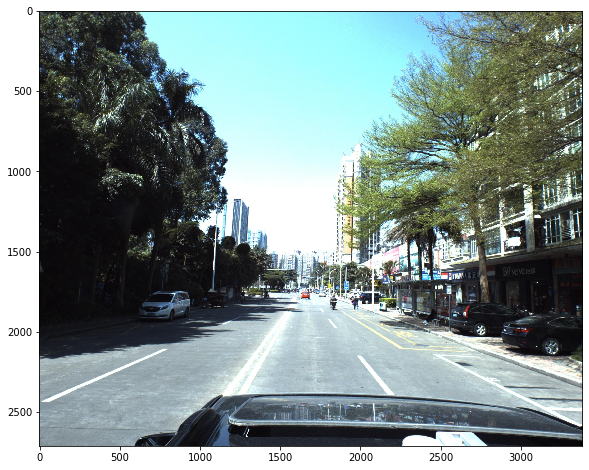

In [7]:
def imread(path, fast_mode=False):
    img = cv2.imread(path)
    if not fast_mode and img is not None and len(img.shape) == 3:
        img = np.array(img[:, :, ::-1])
    return img

img = imread(PATH + 'train_images/ID_8a6e65317' + '.jpg')
IMG_SHAPE = img.shape

plt.figure(figsize=(15,8))
plt.imshow(img);

**PredictionString** column contains pose information about all cars  

From the data description:
> The primary data is images of cars and related pose information. The pose information is formatted as strings, as follows:  
>
> `model type, yaw, pitch, roll, x, y, z`  
>
> A concrete example with two cars in the photo:  
>
> `5 0.5 0.5 0.5 0.0 0.0 0.0 32 0.25 0.25 0.25 0.5 0.4 0.7`  

We will need a function to extract these values:

In [8]:
def str2coords(s, names=['id', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']):
    '''
    Input:
        s: PredictionString (e.g. from train dataframe)
        names: array of what to extract from the string
    Output:
        list of dicts with keys from `names`
    '''
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
        if 'id' in coords[-1]:
            coords[-1]['id'] = int(coords[-1]['id'])
    return coords

In [9]:
inp = train['PredictionString'][0]
print('Example input:\n', inp)
print()
print('Output:\n', str2coords(inp))

Example input:
 16 0.254839 -2.57534 -3.10256 7.96539 3.20066 11.0225 56 0.181647 -1.46947 -3.12159 9.60332 4.66632 19.339 70 0.163072 -1.56865 -3.11754 10.39 11.2219 59.7825 70 0.141942 -3.1395 3.11969 -9.59236 5.13662 24.7337 46 0.163068 -2.08578 -3.11754 9.83335 13.2689 72.9323

Output:
 [{'id': 16, 'yaw': 0.254839, 'pitch': -2.57534, 'roll': -3.10256, 'x': 7.96539, 'y': 3.20066, 'z': 11.0225}, {'id': 56, 'yaw': 0.181647, 'pitch': -1.46947, 'roll': -3.12159, 'x': 9.60332, 'y': 4.66632, 'z': 19.339}, {'id': 70, 'yaw': 0.163072, 'pitch': -1.56865, 'roll': -3.11754, 'x': 10.39, 'y': 11.2219, 'z': 59.7825}, {'id': 70, 'yaw': 0.141942, 'pitch': -3.1395, 'roll': 3.11969, 'x': -9.59236, 'y': 5.13662, 'z': 24.7337}, {'id': 46, 'yaw': 0.163068, 'pitch': -2.08578, 'roll': -3.11754, 'x': 9.83335, 'y': 13.2689, 'z': 72.9323}]


# Data distributions

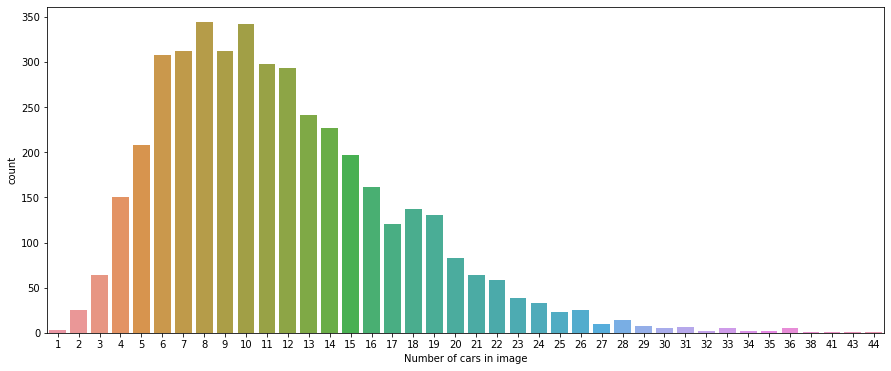

In [10]:
lens = [len(str2coords(s)) for s in train['PredictionString']]

plt.figure(figsize=(15,6))
sns.countplot(lens);
plt.xlabel('Number of cars in image');

DataFrame of all points

In [11]:
points_df = pd.DataFrame()
for col in ['x', 'y', 'z', 'yaw', 'pitch', 'roll']:
    arr = []
    for ps in train['PredictionString']:
        coords = str2coords(ps)
        arr += [c[col] for c in coords]
    points_df[col] = arr

print('len(points_df)', len(points_df))
points_df.head()

len(points_df) 49684


,x,y,z,yaw,pitch,roll
0,7.96539,3.20066,11.0225,0.254839,-2.57534,-3.10256
1,9.60332,4.66632,19.3390,0.181647,-1.46947,-3.12159
2,10.39000,11.22190,59.7825,0.163072,-1.56865,-3.11754
3,-9.59236,5.13662,24.7337,0.141942,-3.13950,3.11969
4,9.83335,13.26890,72.9323,0.163068,-2.08578,-3.11754


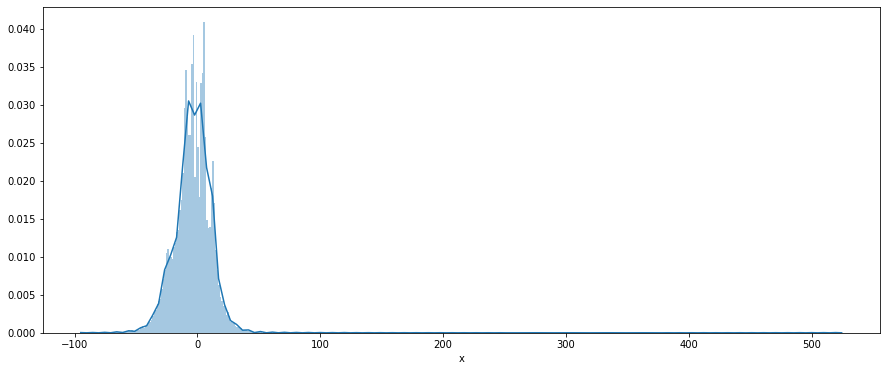

In [12]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['x'], bins=500);
plt.xlabel('x')
plt.show()

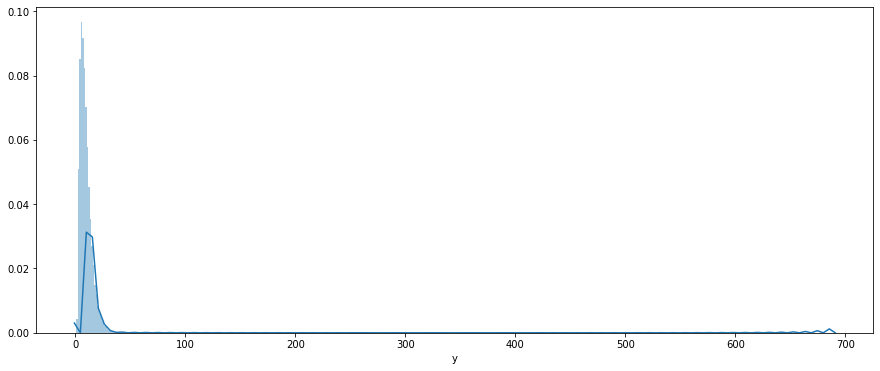

In [13]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['y'], bins=500);
plt.xlabel('y')
plt.show()

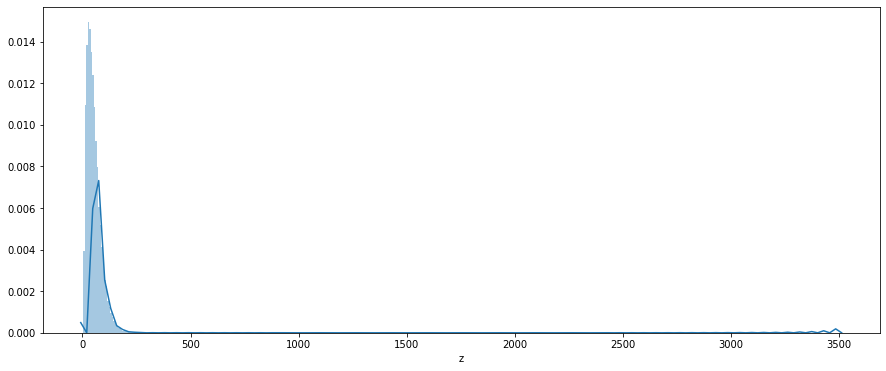

In [14]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['z'], bins=500);
plt.xlabel('z')
plt.show()

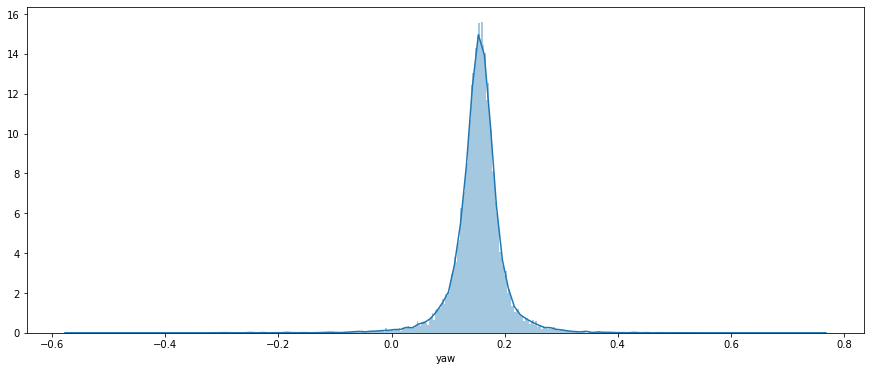

In [15]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['yaw'], bins=500);
plt.xlabel('yaw')
plt.show()

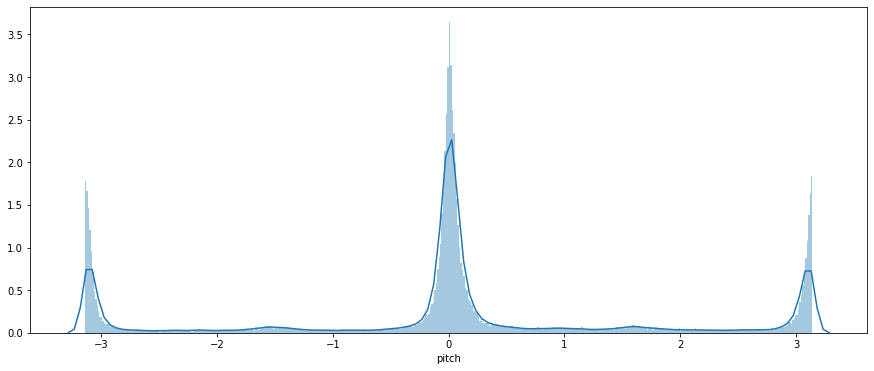

In [16]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['pitch'], bins=500);
plt.xlabel('pitch')
plt.show()

I guess, pitch and yaw are mixed up in this dataset. Pitch cannot be that big. That would mean that cars are upside down.

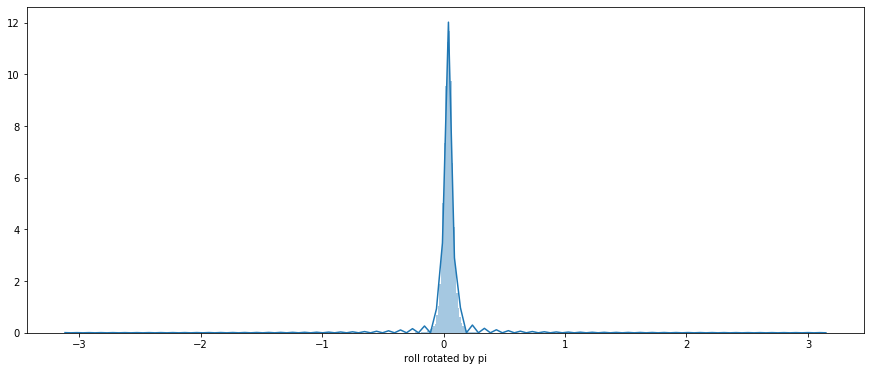

In [17]:
def rotate(x, angle):
    x = x + angle
    x = x - (x + np.pi) // (2 * np.pi) * 2 * np.pi
    return x

plt.figure(figsize=(15,6))
sns.distplot(points_df['roll'].map(lambda x: rotate(x, np.pi)), bins=500);
plt.xlabel('roll rotated by pi')
plt.show()

# 2D Visualization

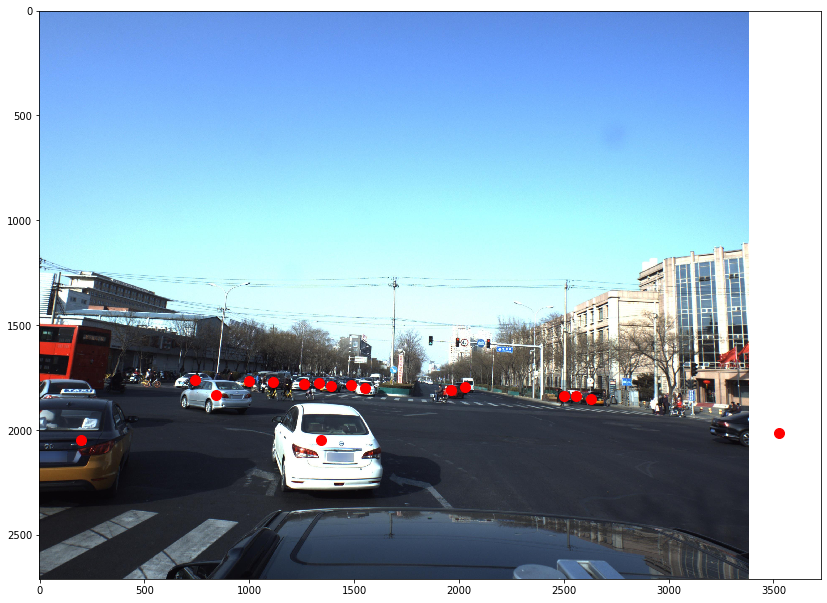

In [18]:
def get_img_coords(s):
    '''
    Input is a PredictionString (e.g. from train dataframe)
    Output is two arrays:
        xs: x coordinates in the image (row)
        ys: y coordinates in the image (column)
    '''
    coords = str2coords(s)
    xs = [c['x'] for c in coords]
    ys = [c['y'] for c in coords]
    zs = [c['z'] for c in coords]
    P = np.array(list(zip(xs, ys, zs))).T
    img_p = np.dot(camera_matrix, P).T
    img_p[:, 0] /= img_p[:, 2]
    img_p[:, 1] /= img_p[:, 2]
    img_xs = img_p[:, 0]
    img_ys = img_p[:, 1]
    img_zs = img_p[:, 2] # z = Distance from the camera
    return img_xs, img_ys

plt.figure(figsize=(14,14))
plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'))
plt.scatter(*get_img_coords(train['PredictionString'][2217]), color='red', s=100);

One point is out of image!

Let's look at the distribution of all points. Image is here just for reference.

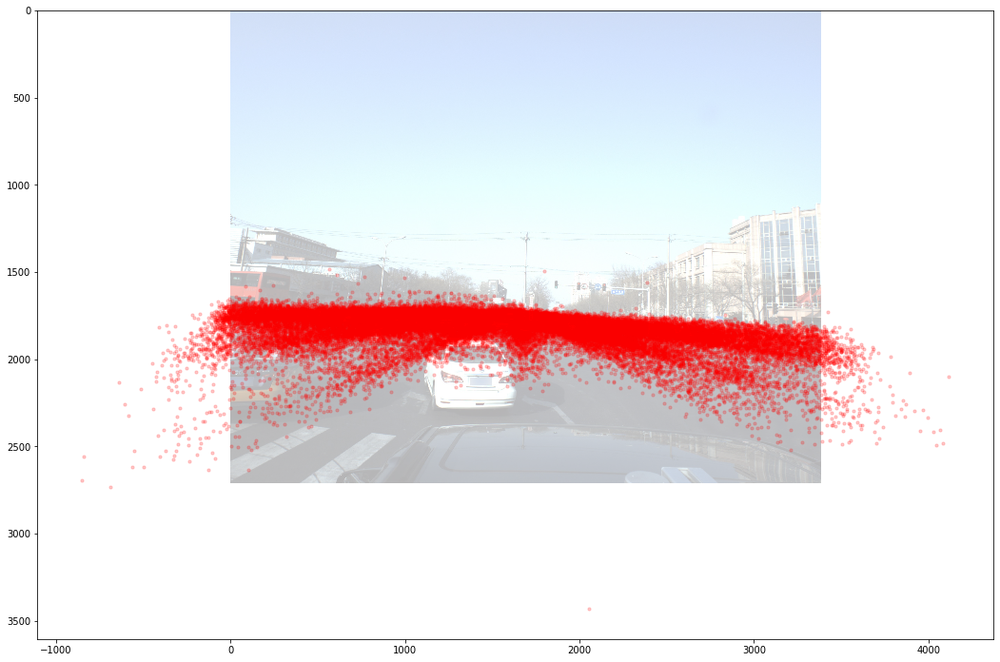

In [19]:
xs, ys = [], []

for ps in train['PredictionString']:
    x, y = get_img_coords(ps)
    xs += list(x)
    ys += list(y)

plt.figure(figsize=(18,18))
plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'), alpha=0.3)
plt.scatter(xs, ys, color='red', s=10, alpha=0.2);

Many points are outside!

Let's look at this distribution "from the sky"

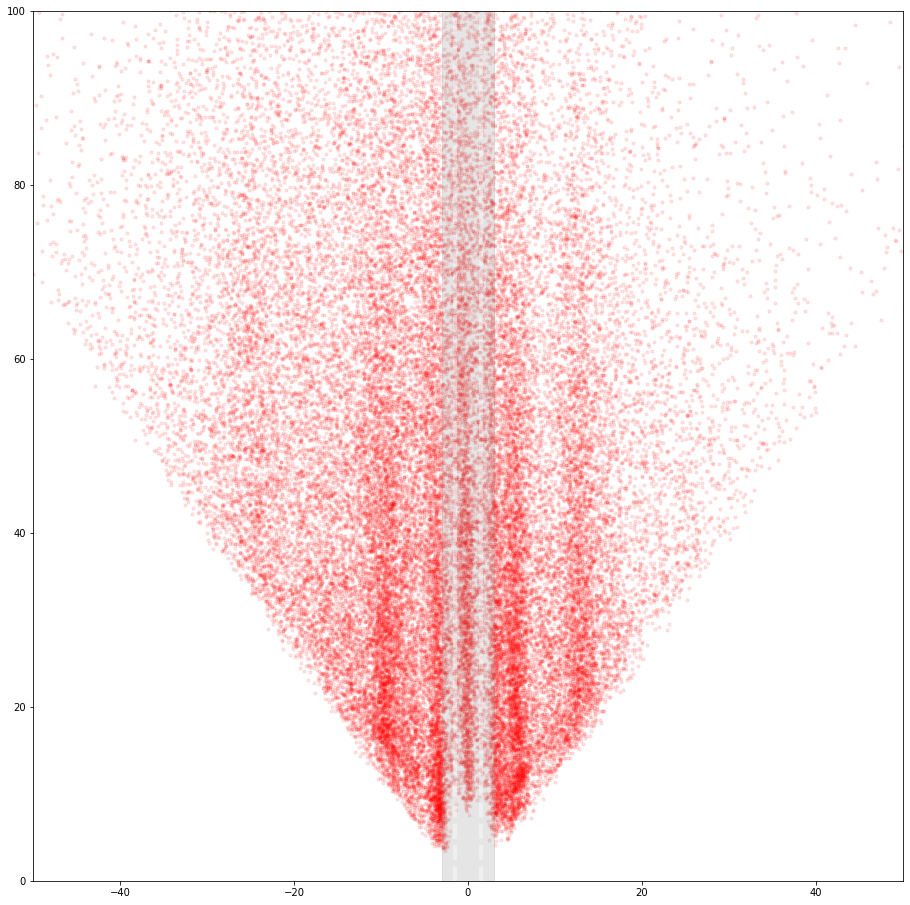

In [20]:
# Road points
road_width = 3
road_xs = [-road_width, road_width, road_width, -road_width, -road_width]
road_ys = [0, 0, 500, 500, 0]

plt.figure(figsize=(16,16))
plt.axes().set_aspect(1)
plt.xlim(-50,50)
plt.ylim(0,100)

# View road
plt.fill(road_xs, road_ys, alpha=0.2, color='gray')
plt.plot([road_width/2,road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
plt.plot([-road_width/2,-road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
# View cars
plt.scatter(points_df['x'], np.sqrt(points_df['z']**2 + points_df['y']**2), color='red', s=10, alpha=0.1);

3d distribution of points:

In [21]:
fig = px.scatter_3d(points_df, x='x', y='y', z='z',color='pitch', range_x=(-50,50), range_y=(0,50), range_z=(0,250), opacity=0.1)
fig.show()

1) `x` is measured from left to right  
2) I thought that `y` is the distance from the car and `z` is height above the road. Looks like this is not the case.  

Let's look how good these points lay in one plane  
Try to predict `y` knowing `x, z`:

In [22]:
zy_slope = LinearRegression()
X = points_df[['z']]
y = points_df['y']
zy_slope.fit(X, y)
print('MAE without x:', mean_absolute_error(y, zy_slope.predict(X)))

# Will use this model later
xzy_slope = LinearRegression()
X = points_df[['x', 'z']]
y = points_df['y']
xzy_slope.fit(X, y)
print('MAE with x:', mean_absolute_error(y, xzy_slope.predict(X)))

print('\ndy/dx = {:.3f}\ndy/dz = {:.3f}'.format(*xzy_slope.coef_))

MAE without x: 0.6553782352986809
MAE with x: 0.448166128900417

dy/dx = 0.051
dy/dz = 0.169


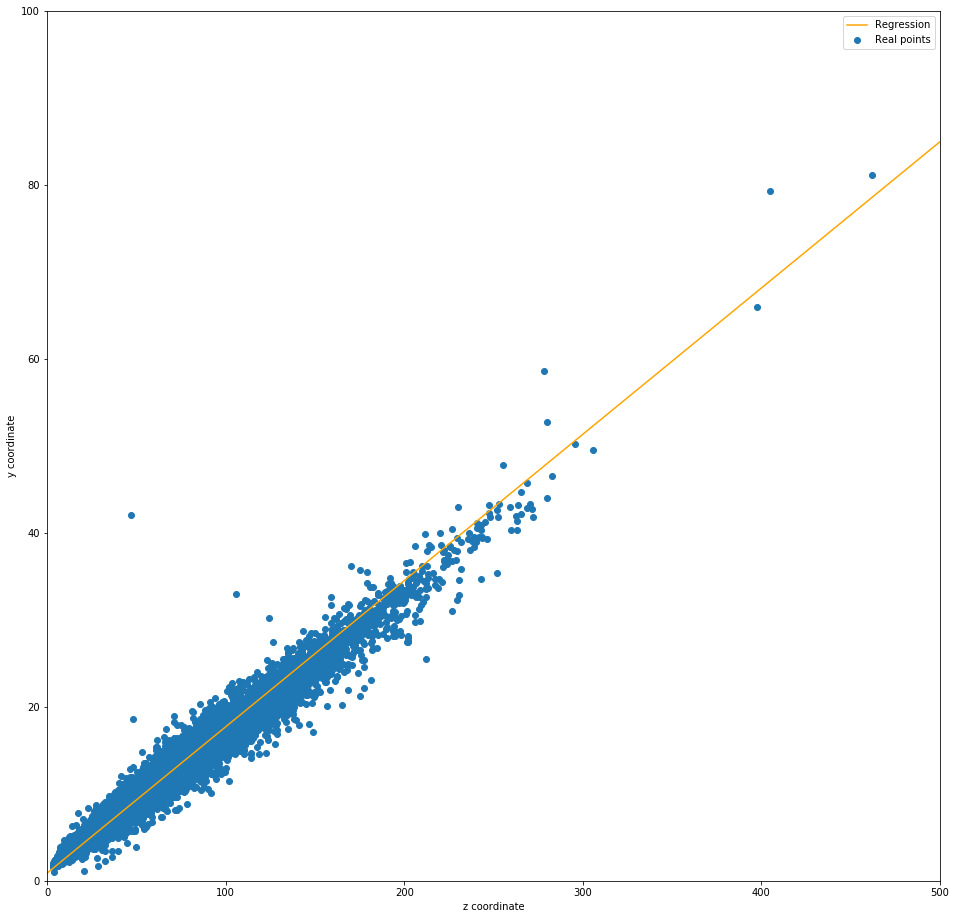

In [23]:
plt.figure(figsize=(16,16))
plt.xlim(0,500)
plt.ylim(0,100)
plt.scatter(points_df['z'], points_df['y'], label='Real points')
X_line = np.linspace(0,500, 10)
plt.plot(X_line, zy_slope.predict(X_line.reshape(-1, 1)), color='orange', label='Regression')
plt.legend()
plt.xlabel('z coordinate')
plt.ylabel('y coordinate');

# 3D Visualization
Used code from https://www.kaggle.com/zstusnoopy/visualize-the-location-and-3d-bounding-box-of-car, but made it one function

In [24]:
from math import sin, cos

# convert euler angle to rotation matrix
def euler_to_Rot(yaw, pitch, roll):
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))

In [25]:
def draw_line(image, points):
    color = (255, 0, 0)
    cv2.line(image, tuple(points[0][:2]), tuple(points[3][:2]), color, 16)
    cv2.line(image, tuple(points[0][:2]), tuple(points[1][:2]), color, 16)
    cv2.line(image, tuple(points[1][:2]), tuple(points[2][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, 16)
    return image


def draw_points(image, points):
    for (p_x, p_y, p_z) in points:
        cv2.circle(image, (p_x, p_y), int(1000 / p_z), (0, 255, 0), -1)
#         if p_x > image.shape[1] or p_y > image.shape[0]:
#             print('Point', p_x, p_y, 'is out of image with shape', image.shape)
    return image

In [26]:
def visualize(img, coords):
    # You will also need functions from the previous cells
    x_l = 1.02
    y_l = 0.80
    z_l = 2.31
    
    img = img.copy()
    for point in coords:
        print("\nvisualze, point:", point)
        # Get values
        x, y, z = point['x'], point['y'], point['z']
        yaw, pitch, roll = -point['pitch'], -point['yaw'], -point['roll']
        # Math
        Rt = np.eye(4)
        print("\nvisualize, Rt.shape:", Rt.shape)
        t = np.array([x, y, z])
        print("\nvisualize, Rt[:3, 3] before assigment t:\n", Rt[:3, 3])
        Rt[:3, 3] = t
        print("\nvisualize, Rt[:3, 3] after assigment t:\n", Rt[:3, 3])
        print("\nvisualize, Rt after assigment t:\n", Rt)
        Rt[:3, :3] = euler_to_Rot(yaw, pitch, roll).T
        print("\nvisualize, Rt[:3, :3] after euler_to_Rot:\n", Rt[:3, :3])
        print("\nvisualize, Rt after euler_to_Rot:\n", Rt)
        print("\nvisualize, Rt[:3, :] after euler_to_Rot:\n", Rt[:3, :])
        Rt = Rt[:3, :]
        print("\nvisualize, Rt after assigment Rt[:3, :]:\n", Rt)
        print("\nvisualize, Rt.shape after assigment Rt[:3, :]:\n", Rt.shape)
        P = np.array([[x_l, -y_l, -z_l, 1],
                      [x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, -z_l, 1],
                      [0, 0, 0, 1]]).T
        img_cor_points = np.dot(camera_matrix, np.dot(Rt, P))
        img_cor_points = img_cor_points.T
        img_cor_points[:, 0] /= img_cor_points[:, 2]
        img_cor_points[:, 1] /= img_cor_points[:, 2]
        img_cor_points = img_cor_points.astype(int)
        # Drawing
        img = draw_line(img, img_cor_points)
        img = draw_points(img, img_cor_points[-1:])
    
    return img


visualze, point: {'id': 16, 'yaw': 0.254839, 'pitch': -2.57534, 'roll': -3.10256, 'x': 7.96539, 'y': 3.20066, 'z': 11.0225}

visualize, Rt.shape: (4, 4)

visualize, Rt[:3, 3] before assigment t:
 [0. 0. 0.]

visualize, Rt[:3, 3] after assigment t:
 [ 7.96539  3.20066 11.0225 ]

visualize, Rt after assigment t:
 [[ 1.       0.       0.       7.96539]
 [ 0.       1.       0.       3.20066]
 [ 0.       0.       1.      11.0225 ]
 [ 0.       0.       0.       1.     ]]

visualize, Rt[:3, :3] after euler_to_Rot:
 [[ 0.83799704  0.03776246  0.54436656]
 [ 0.16806832 -0.96696682 -0.19164607]
 [ 0.51914737  0.25208961 -0.81666201]]

visualize, Rt after euler_to_Rot:
 [[ 0.83799704  0.03776246  0.54436656  7.96539   ]
 [ 0.16806832 -0.96696682 -0.19164607  3.20066   ]
 [ 0.51914737  0.25208961 -0.81666201 11.0225    ]
 [ 0.          0.          0.          1.        ]]

visualize, Rt[:3, :] after euler_to_Rot:
 [[ 0.83799704  0.03776246  0.54436656  7.96539   ]
 [ 0.16806832 -0.96696682 -0.191

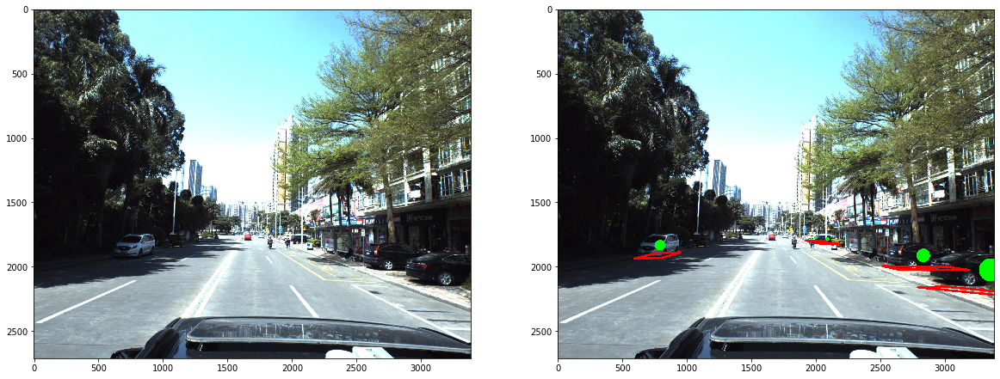


visualze, point: {'id': 66, 'yaw': 0.163988, 'pitch': 0.192169, 'roll': -3.12112, 'x': -3.17424, 'y': 6.55331, 'z': 31.4339}

visualize, Rt.shape: (4, 4)

visualize, Rt[:3, 3] before assigment t:
 [0. 0. 0.]

visualize, Rt[:3, 3] after assigment t:
 [-3.17424  6.55331 31.4339 ]

visualize, Rt after assigment t:
 [[ 1.       0.       0.      -3.17424]
 [ 0.       1.       0.       6.55331]
 [ 0.       0.       1.      31.4339 ]
 [ 0.       0.       0.       1.     ]]

visualize, Rt[:3, :3] after euler_to_Rot:
 [[-0.98074831  0.02019658 -0.19422888]
 [-0.05126748 -0.98637733  0.15630551]
 [-0.18842613  0.16325399  0.96842332]]

visualize, Rt after euler_to_Rot:
 [[-9.80748306e-01  2.01965831e-02 -1.94228883e-01 -3.17424000e+00]
 [-5.12674826e-02 -9.86377328e-01  1.56305512e-01  6.55331000e+00]
 [-1.88426130e-01  1.63253992e-01  9.68423321e-01  3.14339000e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]

visualize, Rt[:3, :] after euler_to_Rot:
 [[-9.80748306e-01 

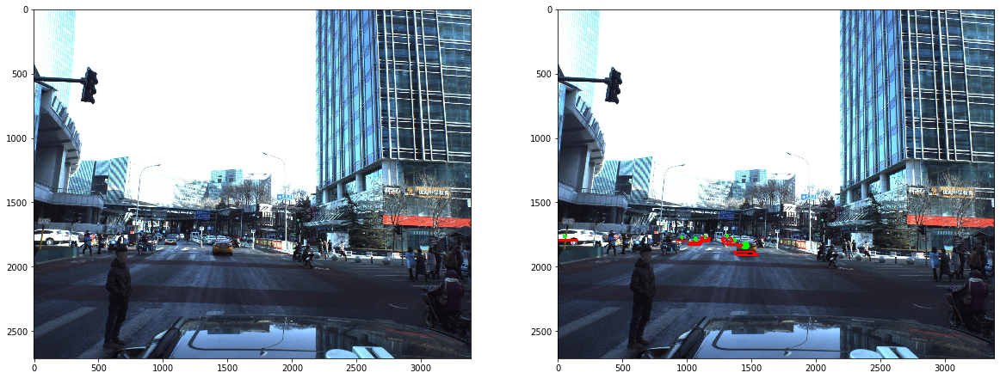


visualze, point: {'id': 43, 'yaw': 0.162877, 'pitch': 0.00519276, 'roll': -3.02676, 'x': 2.1876, 'y': 3.53427, 'z': 13.3436}

visualize, Rt.shape: (4, 4)

visualize, Rt[:3, 3] before assigment t:
 [0. 0. 0.]

visualize, Rt[:3, 3] after assigment t:
 [ 2.1876   3.53427 13.3436 ]

visualize, Rt after assigment t:
 [[ 1.       0.       0.       2.1876 ]
 [ 0.       1.       0.       3.53427]
 [ 0.       0.       1.      13.3436 ]
 [ 0.       0.       0.       1.     ]]

visualize, Rt[:3, :3] after euler_to_Rot:
 [[-0.9933041   0.11306396 -0.0237384 ]
 [-0.1154154  -0.98026598  0.16049266]
 [-0.00512401  0.1621578   0.98675154]]

visualize, Rt after euler_to_Rot:
 [[-9.93304098e-01  1.13063955e-01 -2.37383992e-02  2.18760000e+00]
 [-1.15415398e-01 -9.80265980e-01  1.60492663e-01  3.53427000e+00]
 [-5.12400996e-03  1.62157796e-01  9.86751536e-01  1.33436000e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]

visualize, Rt[:3, :] after euler_to_Rot:
 [[-9.93304098e-01 

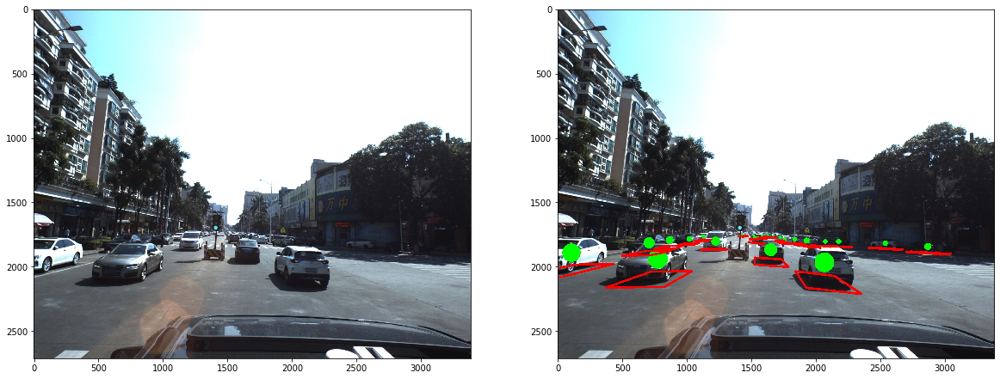


visualze, point: {'id': 43, 'yaw': 0.126957, 'pitch': -3.04442, 'roll': -3.10883, 'x': -14.738, 'y': 24.6389, 'z': 143.13}

visualize, Rt.shape: (4, 4)

visualize, Rt[:3, 3] before assigment t:
 [0. 0. 0.]

visualize, Rt[:3, 3] after assigment t:
 [-14.738   24.6389 143.13  ]

visualize, Rt after assigment t:
 [[  1.       0.       0.     -14.738 ]
 [  0.       1.       0.      24.6389]
 [  0.       0.       1.     143.13  ]
 [  0.       0.       0.       1.    ]]

visualize, Rt[:3, :3] after euler_to_Rot:
 [[ 0.99434594  0.03249316  0.10109571]
 [ 0.04487995 -0.99141945 -0.12277322]
 [ 0.09623896  0.12661622 -0.9872722 ]]

visualize, Rt after euler_to_Rot:
 [[ 9.94345942e-01  3.24931588e-02  1.01095710e-01 -1.47380000e+01]
 [ 4.48799494e-02 -9.91419450e-01 -1.22773221e-01  2.46389000e+01]
 [ 9.62389631e-02  1.26616224e-01 -9.87272198e-01  1.43130000e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]

visualize, Rt[:3, :] after euler_to_Rot:
 [[ 9.94345942e-01  3

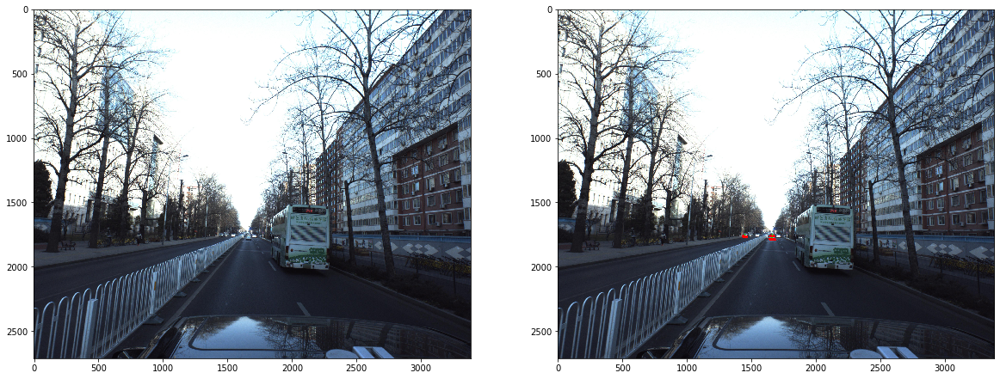


visualze, point: {'id': 37, 'yaw': 0.16017, 'pitch': 0.00862796, 'roll': -3.0887, 'x': -3.04548, 'y': 3.4977, 'z': 12.9646}

visualize, Rt.shape: (4, 4)

visualize, Rt[:3, 3] before assigment t:
 [0. 0. 0.]

visualize, Rt[:3, 3] after assigment t:
 [-3.04548  3.4977  12.9646 ]

visualize, Rt after assigment t:
 [[ 1.       0.       0.      -3.04548]
 [ 0.       1.       0.       3.4977 ]
 [ 0.       0.       1.      12.9646 ]
 [ 0.       0.       0.       1.     ]]

visualize, Rt[:3, :3] after euler_to_Rot:
 [[-0.99849159  0.05219129 -0.01704718]
 [-0.05424012 -0.9858196   0.15880093]
 [-0.00851742  0.15948603  0.98716344]]

visualize, Rt after euler_to_Rot:
 [[-9.98491594e-01  5.21912941e-02 -1.70471799e-02 -3.04548000e+00]
 [-5.42401246e-02 -9.85819595e-01  1.58800928e-01  3.49770000e+00]
 [-8.51741803e-03  1.59486033e-01  9.87163441e-01  1.29646000e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]

visualize, Rt[:3, :] after euler_to_Rot:
 [[-9.98491594e-01  

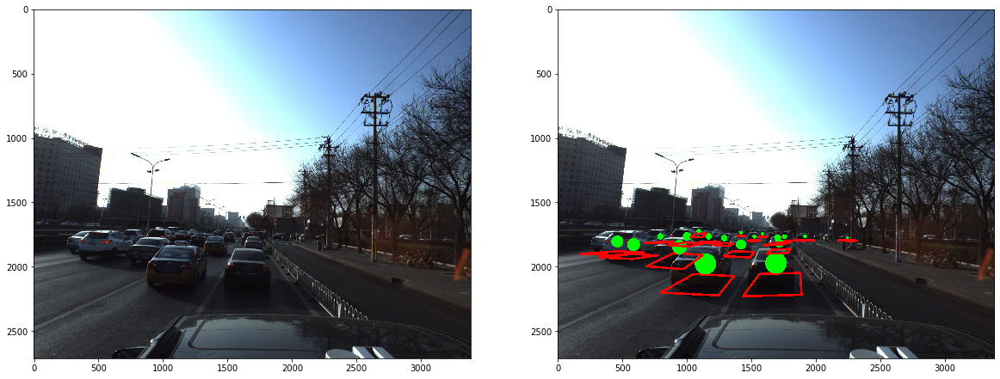


visualze, point: {'id': 50, 'yaw': 0.173958, 'pitch': 1.6934, 'roll': -3.07, 'x': 17.2953, 'y': 5.82861, 'z': 22.8229}

visualize, Rt.shape: (4, 4)

visualize, Rt[:3, 3] before assigment t:
 [0. 0. 0.]

visualize, Rt[:3, 3] after assigment t:
 [17.2953   5.82861 22.8229 ]

visualize, Rt after assigment t:
 [[ 1.       0.       0.      17.2953 ]
 [ 0.       1.       0.       5.82861]
 [ 0.       0.       1.      22.8229 ]
 [ 0.       0.       0.       1.     ]]

visualize, Rt[:3, :3] after euler_to_Rot:
 [[ 0.13427134  0.07045192 -0.98843702]
 [-0.16259461 -0.98238443 -0.0921077 ]
 [-0.9775143   0.17308196 -0.12045097]]

visualize, Rt after euler_to_Rot:
 [[ 0.13427134  0.07045192 -0.98843702 17.2953    ]
 [-0.16259461 -0.98238443 -0.0921077   5.82861   ]
 [-0.9775143   0.17308196 -0.12045097 22.8229    ]
 [ 0.          0.          0.          1.        ]]

visualize, Rt[:3, :] after euler_to_Rot:
 [[ 0.13427134  0.07045192 -0.98843702 17.2953    ]
 [-0.16259461 -0.98238443 -0.0921077 

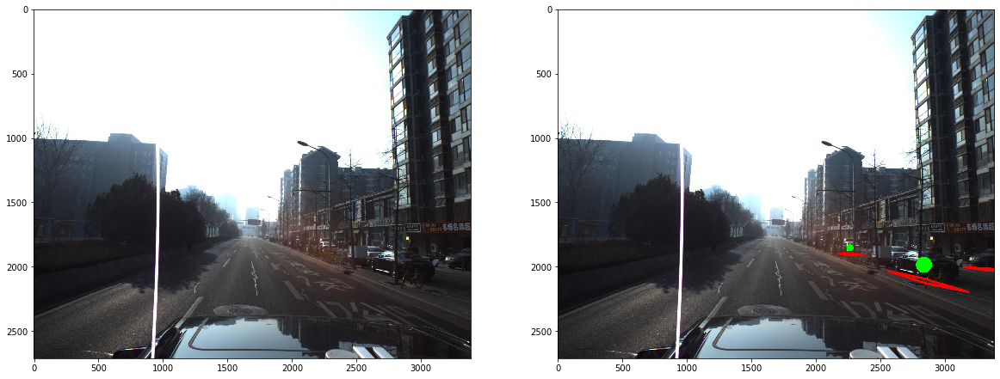

In [27]:
n_rows = 6

for idx in range(n_rows):
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    img = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
    axes[0].imshow(img)
    img_vis = visualize(img, str2coords(train['PredictionString'].iloc[idx]))
    axes[1].imshow(img_vis)
    plt.show()

# Image preprocessing

In [28]:
IMG_WIDTH = 1024
IMG_HEIGHT = IMG_WIDTH // 16 * 5
MODEL_SCALE = 8

def _regr_preprocess(regr_dict, flip=False):
    print("\n_regr_prepocess, regr_dict:\n", regr_dict)
    if flip:
        for k in ['x', 'pitch', 'roll']:
            regr_dict[k] = -regr_dict[k]
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] / 100
    print("\n_regr_prepocess, regr_dict after scaling:\n", regr_dict)
    regr_dict['roll'] = rotate(regr_dict['roll'], np.pi)
    print("\n_regr_prepocess, regr_dict after rotate(regr_dict['roll'], np.pi) :\n", regr_dict)
    regr_dict['pitch_sin'] = sin(regr_dict['pitch'])
    regr_dict['pitch_cos'] = cos(regr_dict['pitch'])
    print("\n_regr_prepocess, regr_dict after sin(regr_dict['pitch']), and cos(regr_dict['pitch'])) :\n", regr_dict)
    regr_dict.pop('pitch')
    regr_dict.pop('id')
    print("\n_regr_prepocess, regr_dict after regr_dict.pop('pitch') and regr_dict.pop('id'):\n", regr_dict)
    return regr_dict

def _regr_back(regr_dict):
    print("\n_regr_back, regr_dict:\n", regr_dict)
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] * 100
    print("\n_regr_back, regr_dict after scaling x, y, z by * 100:\n", regr_dict)
    regr_dict['roll'] = rotate(regr_dict['roll'], -np.pi)
    print("\n_regr_back, regr_dict after rotate(regr_dict['roll'], -np.pi):\n", regr_dict)
    pitch_sin = regr_dict['pitch_sin'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    print("\n_regr_back, pitch_sin:\n", pitch_sin)
    pitch_cos = regr_dict['pitch_cos'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    print("\n_regr_back, pitch_cos:\n", pitch_cos)
    regr_dict['pitch'] = np.arccos(pitch_cos) * np.sign(pitch_sin)
    print("\n_regr_back, regr_dict after np.arccos(pitch_cos) * np.sign(pitch_sin) :\n", regr_dict)
    return regr_dict

def preprocess_image(img, flip=False):
    print("\nprepocess_image, img.shape", img.shape)
    print("\nprepocess_image, img:\n", img)
    img = img[img.shape[0] // 2:]
    print("\nprepocess_image, img.shape after img = img[img.shape[0] // 2:]:", img.shape)
    print("\nprepocess_image, img after img = img[img.shape[0] // 2:]:\n", img)
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
    print("\nprepocess_image, bg.shape:", bg.shape)
    print("\nprepocess_image, bg:\n", bg)

    bg = bg[:, :img.shape[1] // 6]
    print("\nprepocess_image, bg.shape after bg = bg[:, :img.shape[1] // 6] :", bg.shape)
    print("\nprepocess_image, bg after bg = bg[:, :img.shape[1] // 6]:\n", bg)
    img = np.concatenate([bg, img, bg], 1)
    print("\nprepocess_image, img.shape after img = np.concatenate([bg, img, bg], 1): ", img.shape)
    print("\nprepocess_image, img after img = np.concatenate([bg, img, bg], 1) :\n", img)
    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    print("\nprepocess_image, img.shape after img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT)): ", img.shape)
    print("\nprepocess_image, img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT)) 1) :\n", img)
    if flip:
        img = img[:,::-1]
    return (img / 255).astype('float32')

def get_mask_and_regr(img, labels, flip=False):
    print("\nget_mask_and_regr, img.shape:", img.shape)
    print("\nget_mask_and_regr, img:\n", img)
    #print("\nget_mask_and_regr, labels.shape:", labels.shape)
    print("\nget_mask_and_regr, labels:\n", labels)
    mask = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE], dtype='float32')
    print("\nget_mask_and_regr, mask.shape:", mask.shape)
    regr_names = ['x', 'y', 'z', 'yaw', 'pitch', 'roll']
    regr = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE, 7], dtype='float32')
    print("\nget_mask_and_regr, regr.shape:", regr.shape)
    print("\nget_mask_and_regr, regr:\n", regr)
    coords = str2coords(labels)
    print("\nget_mask_and_regr, coords = str2coords(labels):\n", coords)
    xs, ys = get_img_coords(labels)
    print("\nget_mask_and_regr, xs, ys = get_img_coords(labels):\n", xs, "\n", ys)
    for x, y, regr_dict in zip(xs, ys, coords):
        x, y = y, x
        print("\nget_mask_and_regr, x, y = y, x:\n", x, "\n", y)
        x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE
        print("\nget_mask_and_regr, x after x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE:\n", x)
        x = np.round(x).astype('int')
        y = (y + img.shape[1] // 6) * IMG_WIDTH / (img.shape[1] * 4/3) / MODEL_SCALE
        print("\nget_mask_and_regr, y after y = (y + img.shape[1] // 6) * IMG_WIDTH / (img.shape[1] * 4/3) / MODEL_SCALE:\n", y)
        y = np.round(y).astype('int')
        if x >= 0 and x < IMG_HEIGHT // MODEL_SCALE and y >= 0 and y < IMG_WIDTH // MODEL_SCALE:
            mask[x, y] = 1
            regr_dict = _regr_preprocess(regr_dict, flip)
            regr[x, y] = [regr_dict[n] for n in sorted(regr_dict)]
    if flip:
        mask = np.array(mask[:,::-1])
        regr = np.array(regr[:,::-1])
    return mask, regr

In [29]:
IMG_WIDTH = 1024
IMG_HEIGHT = IMG_WIDTH // 16 * 5
MODEL_SCALE = 8

def _regr_preprocess(regr_dict, flip=False):
    if flip:
        for k in ['x', 'pitch', 'roll']:
            regr_dict[k] = -regr_dict[k]
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] / 100
    regr_dict['roll'] = rotate(regr_dict['roll'], np.pi)
    regr_dict['pitch_sin'] = sin(regr_dict['pitch'])
    regr_dict['pitch_cos'] = cos(regr_dict['pitch'])
    regr_dict.pop('pitch')
    regr_dict.pop('id')
    return regr_dict

def _regr_back(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] * 100
    regr_dict['roll'] = rotate(regr_dict['roll'], -np.pi)
    
    pitch_sin = regr_dict['pitch_sin'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    pitch_cos = regr_dict['pitch_cos'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    regr_dict['pitch'] = np.arccos(pitch_cos) * np.sign(pitch_sin)
    return regr_dict

def preprocess_image(img, flip=False):
    img = img[img.shape[0] // 2:]
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
    bg = bg[:, :img.shape[1] // 6]
    img = np.concatenate([bg, img, bg], 1)
    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    if flip:
        img = img[:,::-1]
    return (img / 255).astype('float32')

def get_mask_and_regr(img, labels, flip=False):
    mask = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE], dtype='float32')
    regr_names = ['x', 'y', 'z', 'yaw', 'pitch', 'roll']
    regr = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE, 7], dtype='float32')
    coords = str2coords(labels)
    xs, ys = get_img_coords(labels)
    for x, y, regr_dict in zip(xs, ys, coords):
        x, y = y, x
        x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + img.shape[1] // 6) * IMG_WIDTH / (img.shape[1] * 4/3) / MODEL_SCALE
        y = np.round(y).astype('int')
        if x >= 0 and x < IMG_HEIGHT // MODEL_SCALE and y >= 0 and y < IMG_WIDTH // MODEL_SCALE:
            mask[x, y] = 1
            regr_dict = _regr_preprocess(regr_dict, flip)
            regr[x, y] = [regr_dict[n] for n in sorted(regr_dict)]
    if flip:
        mask = np.array(mask[:,::-1])
        regr = np.array(regr[:,::-1])
    return mask, regr

img.shape (320, 1024, 3) std: 0.29819912
mask.shape (40, 128) std: 0.031234737
regr.shape (40, 128, 7) std: 0.013211883


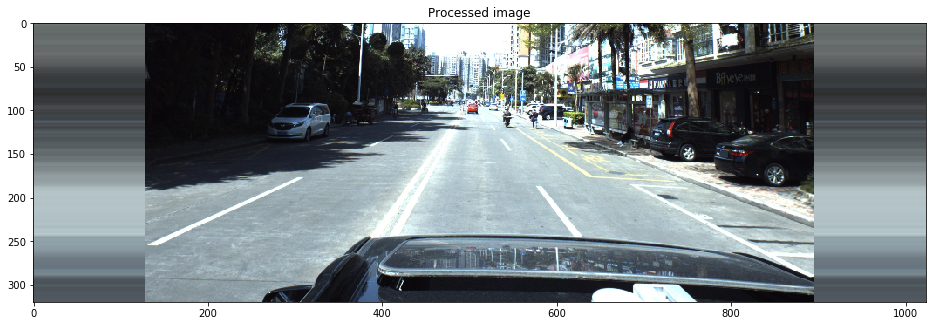

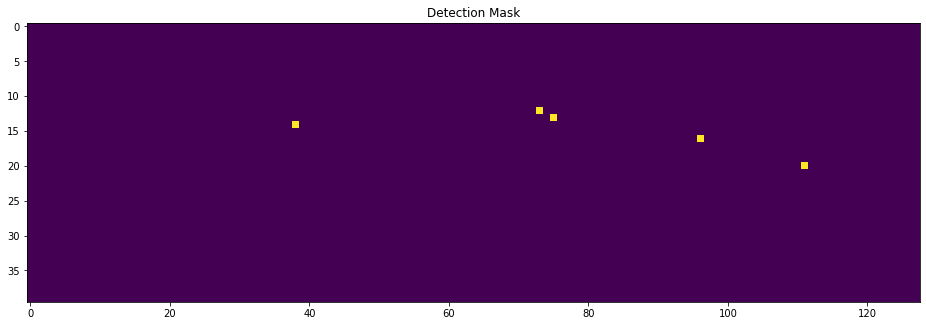

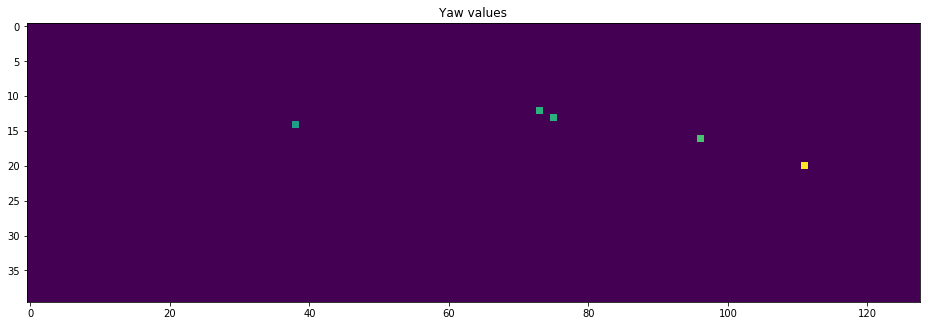

In [30]:
img0 = imread(PATH + 'train_images/' + train['ImageId'][0] + '.jpg')
img = preprocess_image(img0)

mask, regr = get_mask_and_regr(img0, train['PredictionString'][0])

print('img.shape', img.shape, 'std:', np.std(img))
print('mask.shape', mask.shape, 'std:', np.std(mask))
print('regr.shape', regr.shape, 'std:', np.std(regr))

plt.figure(figsize=(16,16))
plt.title('Processed image')
plt.imshow(img)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Detection Mask')
plt.imshow(mask)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Yaw values')
plt.imshow(regr[:,:,-2])
plt.show()

Define functions to convert back from 2d map to 3d coordinates and angles

In [31]:
DISTANCE_THRESH_CLEAR = 2

def convert_3d_to_2d(x, y, z, fx = 2304.5479, fy = 2305.8757, cx = 1686.2379, cy = 1354.9849):
    # stolen from https://www.kaggle.com/theshockwaverider/eda-visualization-baseline
    return x * fx / z + cx, y * fy / z + cy

def optimize_xy(r, c, x0, y0, z0, flipped=False):
    print("\noptimize_xy, r, c, x0, y0, z0", r, c, x0, y0, z0)
    def distance_fn(xyz):
        x, y, z = xyz
        print("\ndistance_fn, x, y, z:", x, y, z)
        xx = -x if flipped else x
        print("\ndistance_fn, xx:", xx)
        slope_err = (xzy_slope.predict([[xx,z]])[0] - y)**2
        print("\ndistance_fn, slope_err = (xzy_slope.predict([[xx,z]])[0] - y)**2:", slope_err)        
        x, y = convert_3d_to_2d(x, y, z)
        print("\ndistance_fn, x, y = convert_3d_to_2d(x, y, z):", x, y)
        y, x = x, y
        print("\ndistance_fn, y, x = x, y:", x, y)
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        print("\ndistance_fn, x after scaling:", x)
        y = (y + IMG_SHAPE[1] // 6) * IMG_WIDTH / (IMG_SHAPE[1] * 4 / 3) / MODEL_SCALE
        print("\ndistance_fn, y after scaling:", y)
        print("\ndistance_fn, return value:", max(0.2, (x-r)**2 + (y-c)**2) + max(0.4, slope_err))
        return max(0.2, (x-r)**2 + (y-c)**2) + max(0.4, slope_err)
    
    def distance_fn(xyz):
        x, y, z = xyz
        xx = -x if flipped else x
        slope_err = (xzy_slope.predict([[xx,z]])[0] - y)**2
        x, y = convert_3d_to_2d(x, y, z)
        y, x = x, y
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        y = (y + IMG_SHAPE[1] // 6) * IMG_WIDTH / (IMG_SHAPE[1] * 4 / 3) / MODEL_SCALE
        return max(0.2, (x-r)**2 + (y-c)**2) + max(0.4, slope_err)
    
    res = minimize(distance_fn, [x0, y0, z0], method='Powell')
    print("\noptimize_xy, res = minimize(distance_fn, [x0, y0, z0], method='Powell'): ", res)
    x_new, y_new, z_new = res.x
    print("\noptimize_xy, x_new, y_new, z_new = res.x: ", x_new, y_new, z_new)
    return x_new, y_new, z_new

def clear_duplicates(coords):
    print("\nclear_duplicates, coords:\n", coords)
    for c1 in coords:
        print("\nclear_duplicates, c1: ", c1)
        xyz1 = np.array([c1['x'], c1['y'], c1['z']])
        print("\nclear_duplicates, xyz1 = np.array([c1['x'], c1['y'], c1['z']]):\n", xyz1)
        for c2 in coords:
            print("\nclear_duplicates, c2: ", c2)
            xyz2 = np.array([c2['x'], c2['y'], c2['z']])
            print("\nclear_duplicates, xyz2 = np.array([c1['x'], c1['y'], c1['z']]):\n", xyz2)
            distance = np.sqrt(((xyz1 - xyz2)**2).sum())
            print("\nclear_duplicates, distance = np.sqrt(((xyz1 - xyz2)**2).sum()): ", distance)
            if distance < DISTANCE_THRESH_CLEAR:
                print("\nclear_duplicates, if distance < DISTANCE_THRESH_CLEAR: ", distance < DISTANCE_THRESH_CLEAR)
                if c1['confidence'] < c2['confidence']:
                    print("\nclear_duplicates, if c1['confidence'] < c2['confidence']: ", c1['confidence'] < c2['confidence'])
                    c1['confidence'] = -1
    return [c for c in coords if c['confidence'] > 0]

def extract_coords(prediction, flipped=False):
    print("\nextract_coords, prediction:\n", prediction)
    logits = prediction[0]
    print("\nextract_coords, logits = prediction[0]:\n", logits)
    regr_output = prediction[1:]
    print("\nextract_coords, regr_output = prediction[1:]:\n", regr_output)
    points = np.argwhere(logits > 0)
    print("\nextract_coords, points = np.argwhere(logits > 0):\n", points)
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    for r, c in points:
        print("\nextract_coords, r, c in points: ", r, c)
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        print("\nextract_coords, regr_dict = dict(zip(col_names, regr_output[:, r, c])):\n", regr_dict)
        coords.append(_regr_back(regr_dict))
        print("\nextract_coords, coords after coords.append(_regr_back(regr_dict)):\n", coords)
        coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
        print("\nextract_coords, coords after coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c])):\n", coords)
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = \
                optimize_xy(r, c,
                            coords[-1]['x'],
                            coords[-1]['y'],
                            coords[-1]['z'], flipped)
        print("\nextract_coords, after optimize_xy:\n", coords)
    coords = clear_duplicates(coords)
    print("\nextract_coords, coords = clear_duplicates(coords):\n", coords)
    return coords

def coords2str(coords, names=['yaw', 'pitch', 'roll', 'x', 'y', 'z', 'confidence']):
    s = []
    for c in coords:
        for n in names:
            s.append(str(c.get(n, 0)))
    return ' '.join(s)

In [32]:
DISTANCE_THRESH_CLEAR = 2

def convert_3d_to_2d(x, y, z, fx = 2304.5479, fy = 2305.8757, cx = 1686.2379, cy = 1354.9849):
    # stolen from https://www.kaggle.com/theshockwaverider/eda-visualization-baseline
    return x * fx / z + cx, y * fy / z + cy

def optimize_xy(r, c, x0, y0, z0, flipped=False):
    def distance_fn(xyz):
        x, y, z = xyz
        xx = -x if flipped else x
        slope_err = (xzy_slope.predict([[xx,z]])[0] - y)**2
        x, y = convert_3d_to_2d(x, y, z)
        y, x = x, y
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        y = (y + IMG_SHAPE[1] // 6) * IMG_WIDTH / (IMG_SHAPE[1] * 4 / 3) / MODEL_SCALE
        return max(0.2, (x-r)**2 + (y-c)**2) + max(0.4, slope_err)
    
    res = minimize(distance_fn, [x0, y0, z0], method='Powell')
    x_new, y_new, z_new = res.x
    return x_new, y_new, z_new

def clear_duplicates(coords):
    for c1 in coords:
        xyz1 = np.array([c1['x'], c1['y'], c1['z']])
        for c2 in coords:
            xyz2 = np.array([c2['x'], c2['y'], c2['z']])
            distance = np.sqrt(((xyz1 - xyz2)**2).sum())
            if distance < DISTANCE_THRESH_CLEAR:
                if c1['confidence'] < c2['confidence']:
                    c1['confidence'] = -1
    return [c for c in coords if c['confidence'] > 0]

def extract_coords(prediction, flipped=False):
    logits = prediction[0]
    regr_output = prediction[1:]
    points = np.argwhere(logits > 0)
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    for r, c in points:
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = \
                optimize_xy(r, c,
                            coords[-1]['x'],
                            coords[-1]['y'],
                            coords[-1]['z'], flipped)
    coords = clear_duplicates(coords)
    return coords

def coords2str(coords, names=['yaw', 'pitch', 'roll', 'x', 'y', 'z', 'confidence']):
    s = []
    for c in coords:
        for n in names:
            s.append(str(c.get(n, 0)))
    return ' '.join(s)

Ensure that all the forward and back transformations work consistently

for idx in range(2):
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    
    for ax_i in range(2):
        img0 = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
        if ax_i == 1:
            img0 = img0[:,::-1]
        img = preprocess_image(img0, ax_i==1)
        mask, regr = get_mask_and_regr(img0, train['PredictionString'][idx], ax_i==1)
        regr = np.rollaxis(regr, 2, 0)
        coords = extract_coords(np.concatenate([mask[None], regr], 0), ax_i==1)
        
        axes[ax_i].set_title('Flip = {}'.format(ax_i==1))
        axes[ax_i].imshow(visualize(img0, coords))
        x, y, z = xyz
        xx = -x if flipped else x
        slope_err = (xzy_slope.predict([[xx,z]])[0] - y)**2
        x, y = convert_3d_to_2d(x, y, z)
        y, x = x, y
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        y = (y + IMG_SHAPE[1] // 6) * IMG_WIDTH / (IMG_SHAPE[1] * 4 / 3) / MODEL_SCALE
        return max(0.2, (x-r)**2 + (y-c)**2) + max(0.4, slope_err)
    plt.show()


visualze, point: {'pitch_cos': -0.49252063, 'pitch_sin': -0.87030077, 'roll': -3.1175400001280984, 'x': 10.014624148958578, 'y': 13.268899917627609, 'yaw': 0.163068, 'z': 72.88382384267896, 'pitch': -2.0857799887062027, 'confidence': 0.731058573739949}

visualize, Rt.shape: (4, 4)

visualize, Rt[:3, 3] before assigment t:
 [0. 0. 0.]

visualize, Rt[:3, 3] after assigment t:
 [10.01462415 13.26889992 72.88382384]

visualize, Rt after assigment t:
 [[ 1.          0.          0.         10.01462415]
 [ 0.          1.          0.         13.26889992]
 [ 0.          0.          1.         72.88382384]
 [ 0.          0.          0.          1.        ]]

visualize, Rt[:3, :3] after euler_to_Rot:
 [[ 0.48898009  0.02373128  0.87197207]
 [ 0.15309449 -0.98644844 -0.05900473]
 [ 0.85875523  0.16234626 -0.48598678]]

visualize, Rt after euler_to_Rot:
 [[ 4.88980094e-01  2.37312790e-02  8.71972072e-01  1.00146241e+01]
 [ 1.53094494e-01 -9.86448436e-01 -5.90047305e-02  1.32688999e+01]
 [ 8.587552

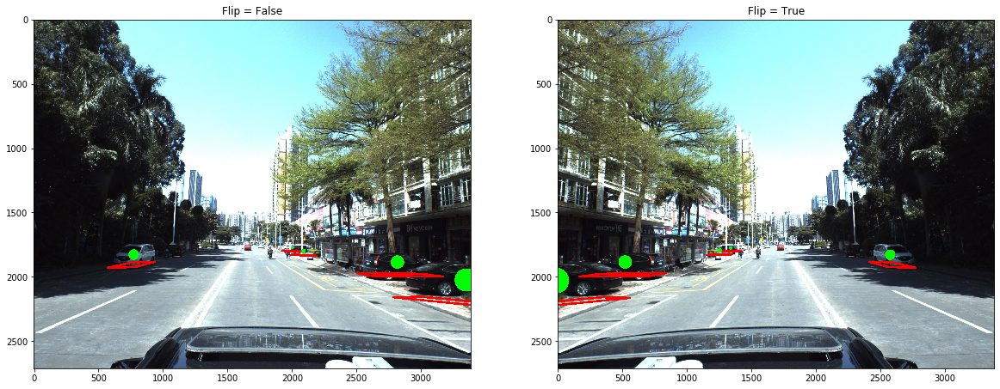


visualze, point: {'pitch_cos': -0.53581583, 'pitch_sin': 0.8443349, 'roll': -3.13968999998691, 'x': -23.946503261266503, 'y': 5.927471688243266, 'yaw': 0.195568, 'z': 34.00583328645143, 'pitch': 2.136270013298094, 'confidence': 0.731058573739949}

visualize, Rt.shape: (4, 4)

visualize, Rt[:3, 3] before assigment t:
 [0. 0. 0.]

visualize, Rt[:3, 3] after assigment t:
 [-23.94650326   5.92747169  34.00583329]

visualize, Rt after assigment t:
 [[  1.           0.           0.         -23.94650326]
 [  0.           1.           0.           5.92747169]
 [  0.           0.           1.          34.00583329]
 [  0.           0.           0.           1.        ]]

visualize, Rt[:3, :3] after euler_to_Rot:
 [[ 0.53612703  0.00186638 -0.84413525]
 [-0.16305454 -0.98093568 -0.10572802]
 [-0.82823971  0.19432373 -0.52560181]]

visualize, Rt after euler_to_Rot:
 [[ 5.36127033e-01  1.86638305e-03 -8.44135251e-01 -2.39465033e+01]
 [-1.63054540e-01 -9.80935677e-01 -1.05728020e-01  5.92747169e+00


visualze, point: {'pitch_cos': 0.9762449, 'pitch_sin': -0.21666986, 'roll': -3.122129999222704, 'x': 9.741671304407145, 'y': 11.245299875765028, 'yaw': 0.0209679, 'z': 62.74324665902154, 'pitch': -0.21840199825540568, 'confidence': 0.731058573739949}

visualize, Rt.shape: (4, 4)

visualize, Rt[:3, 3] before assigment t:
 [0. 0. 0.]

visualize, Rt[:3, 3] after assigment t:
 [ 9.7416713  11.24529988 62.74324666]

visualize, Rt after assigment t:
 [[ 1.          0.          0.          9.7416713 ]
 [ 0.          1.          0.         11.24529988]
 [ 0.          0.          1.         62.74324666]
 [ 0.          0.          0.          1.        ]]

visualize, Rt[:3, :3] after euler_to_Rot:
 [[-0.97614845  0.01945715  0.21623048]
 [-0.0144572  -0.99959083  0.02468113]
 [ 0.21662223  0.02096636  0.97603034]]

visualize, Rt after euler_to_Rot:
 [[-9.76148451e-01  1.94571477e-02  2.16230481e-01  9.74167130e+00]
 [-1.44571994e-02 -9.99590832e-01  2.46811348e-02  1.12452999e+01]
 [ 2.16622231

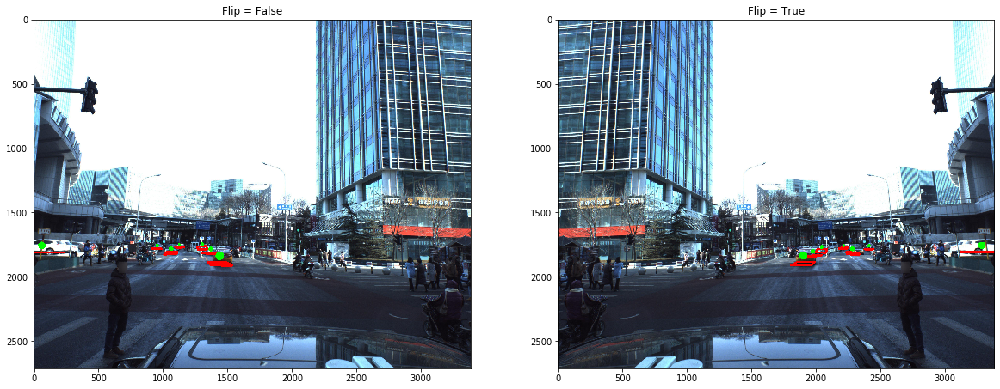

In [33]:
for idx in range(2):
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    
    for ax_i in range(2):
        img0 = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
        if ax_i == 1:
            img0 = img0[:,::-1]
        img = preprocess_image(img0, ax_i==1)
        mask, regr = get_mask_and_regr(img0, train['PredictionString'][idx], ax_i==1)
        regr = np.rollaxis(regr, 2, 0)
        coords = extract_coords(np.concatenate([mask[None], regr], 0), ax_i==1)
        
        axes[ax_i].set_title('Flip = {}'.format(ax_i==1))
        axes[ax_i].imshow(visualize(img0, coords))
    plt.show()

# PyTorch Dataset

In [34]:
class CarDataset(Dataset):
    """Car dataset."""

    def __init__(self, dataframe, root_dir, training=True, transform=None):
        self.df = dataframe
        self.root_dir = root_dir
        self.transform = transform
        self.training = training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # Get image name
        idx, labels = self.df.values[idx]
        img_name = self.root_dir.format(idx)
        
        # Augmentation
        flip = False
        if self.training:
            flip = np.random.randint(10) == 1
        
        # Read image
        img0 = imread(img_name, True)
        #print("\nCarDataset.__getitem__, img0 = imread(img_name, True):\n", img0)
        #print("\nCarDataset.__getitem__, img0.shape:\n", img0.shape)
        img = preprocess_image(img0, flip=flip)
        #print("\nCarDataset.__getitem__, img = preprocess_image(img0, flip=flip):\n", img)
        #print("\nCarDataset.__getitem__, img.shape:\n", img.shape)
        img = np.rollaxis(img, 2, 0)
        #print("\nCarDataset.__getitem__, img = np.rollaxis(img, 2, 0):\n", img)
        #print("\nCarDataset.__getitem__, img.shape:\n", img.shape)
        # Get mask and regression maps
        mask, regr = get_mask_and_regr(img0, labels, flip=flip)
        #print("\nCarDataset.__getitem__, mask, regr = get_mask_and_regr(img0, labels, flip=flip):\n", mask, "\n", regr)
        regr = np.rollaxis(regr, 2, 0)
        #print("\nCarDataset.__getitem__, regr = np.rollaxis(regr, 2, 0):\n", regr)
        #print("\nCarDataset.__getitem__, regr.shape:\n", regr.shape)
        
        return [img, mask, regr]

In [35]:
train_images_dir = PATH + 'train_images/{}.jpg'
test_images_dir = PATH + 'test_images/{}.jpg'

df_train, df_dev = train_test_split(train, test_size=0.01, random_state=42)
df_test = test

# Create dataset objects
train_dataset = CarDataset(df_train, train_images_dir, training=True)
dev_dataset = CarDataset(df_dev, train_images_dir, training=False)
test_dataset = CarDataset(df_test, test_images_dir, training=False)

Show some generated examples

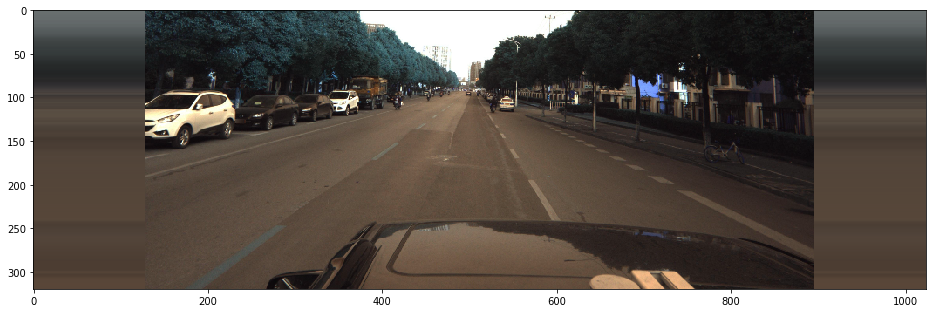

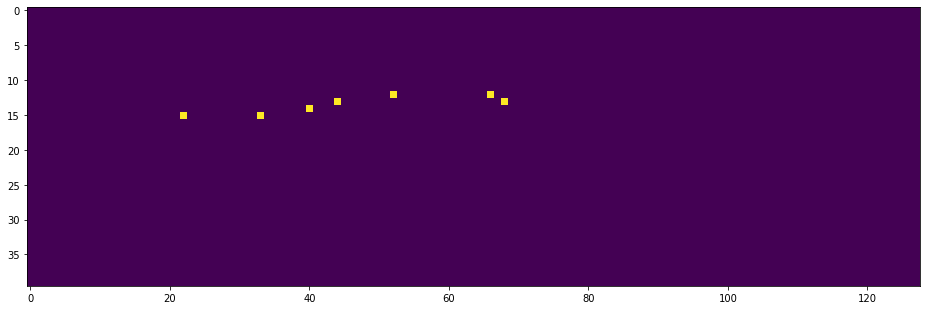

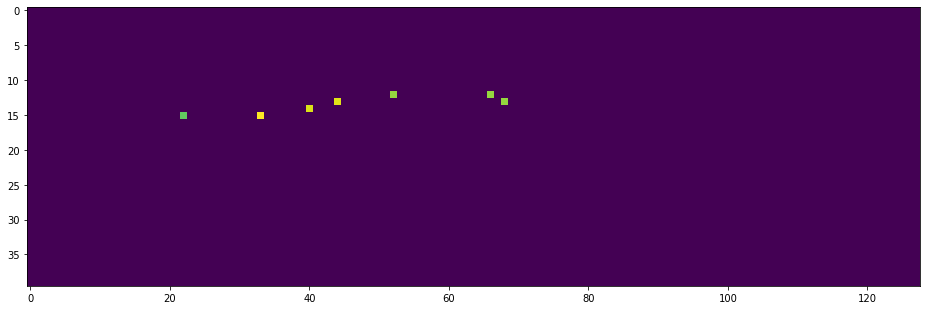

In [36]:
img, mask, regr = train_dataset[0]

plt.figure(figsize=(16,16))
plt.imshow(np.rollaxis(img, 0, 3))
plt.show()

plt.figure(figsize=(16,16))
plt.imshow(mask)
plt.show()

plt.figure(figsize=(16,16))
plt.imshow(regr[-2])
plt.show()

In [37]:
BATCH_SIZE = 4

# Create data generators - they will produce batches
train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
dev_loader = DataLoader(dataset=dev_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

# PyTorch Model

In [38]:
!pip install efficientnet-pytorch

In [39]:
from efficientnet_pytorch import EfficientNet

In [40]:
class double_conv(nn.Module):
    '''(conv => BN => ReLU) * 2'''
    def __init__(self, in_ch, out_ch):
        logging.info("\ndouble_conv.__init__ type(in_ch):\n {}:\n type(out_ch):\n{}\n".format(type(in_ch), type(out_ch)))
        logging.info("\ndouble_conv.__init__ in_ch:\n {}:\n out_ch:\n{}\n".format(in_ch, out_ch))
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )     
        logging.info("double_conv.__init__ self.conv {}:\n".format(self.conv))
        
    def forward(self, x):
        x = self.conv(x)
        logging.info("double_conv.forward type(x) {}:\n".format(type(x)))
        logging.info("double_conv.forward x.size() {}:\n".format(x.size()))
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()
        
        logging.info("\nup.__init__, type(in_ch):\n{}\ntype(out_ch):\n{}\ntype(bilinear):\n{}".format(
            type(in_ch), type(out_ch), type(bilinear)
        ))
        logging.info("\nup.__init__, in_ch: {}, out_ch: {}, bilinear: {}\n".format(in_ch, out_ch, bilinear))
        #  would be a nice idea if the upsampling could be learned too,
        #  but my machine do not have enough memory to handle all those weights
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)
        
        logging.info("\nup.__init__, self.up {}:\n".format(self.up))
        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        logging.info("\nup.forward, type(x1): {}, type(x2): {}\n".format(type(x1), type(x2)))
        logging.info("\nup.forward, x1.size(): {}, x2.size()): {}\n".format(x1.size(), x2.size()))
        x1 = self.up(x1)
        logging.info("\nup.forward, x1 = self.up(x1):\n type(x1)".format(type(x1)))
        logging.info("\nup.forward, x1 = self.up(x1):\n x1.size()".format(x1.size()))
        # input is CHW
        #if x2:
        logging.info("\nup.forward, x2.size(): {}".format(x2.size()))
        logging.info("\nup.forward, x1.size(): {}".format(x1.size()))
        diffY = x2.size()[2] - x1.size()[2]
        logging.info("\nup.forward, diffY = x2.size()[2] - x1.size()[2]: {}".format(diffY))
        diffX = x2.size()[3] - x1.size()[3]
        logging.info("\nup.forward, diffX = x2.size()[3] - x1.size()[3]: {}".format(diffX))
        x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                        diffY // 2, diffY - diffY//2))
        logging.info("\nup.forward, x1.size() after F.pad: {}\n".format(x1.size()))
        # for padding issues, see 
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
            logging.info("\nup.forward, x = torch.cat([x2, x1], dim=1): x.size() {}\n".format(x.size()))
        else:
            x = x1
            logging.info("\nup.forward, x = x1, x.size(): {}\n".format(x.size()))
        x = self.conv(x)
        logging.info("\nup.forward, x = self.conv(x), x.size(): {}\n".format(x.size()))
        return x

def get_mesh(batch_size, shape_x, shape_y):
    logging.info("\nget_mesh, batch_size: {}, shape_x: {}, shape_y {}\n".format(batch_size, shape_x, shape_y))
    mg_x, mg_y = np.meshgrid(np.linspace(0, 1, shape_y), np.linspace(0, 1, shape_x))
    logging.info("\nget_mesh, mg_x.shape: {}, mg_y.shape: {} before np.tile\n".format(mg_x.shape, mg_y.shape))
    mg_x = np.tile(mg_x[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mg_y = np.tile(mg_y[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    logging.info("\nget_mesh, mg_x.shape: {}, mg_y.shape: {} after np.tile\n".format(mg_x.shape, mg_y.shape))
    mesh = torch.cat([torch.tensor(mg_x).to(device), torch.tensor(mg_y).to(device)], 1)
    logging.info("\nmesh.size(): {}\n".format(mesh.size()))
    return mesh

In [41]:
class MyUNet(nn.Module):
    '''Mixture of previous classes'''
    def __init__(self, n_classes):
        logging.info("\nMyUNet.__init__, n_classes: {}\n".format(n_classes))
        super(MyUNet, self).__init__()
        self.base_model = EfficientNet.from_pretrained('efficientnet-b0')
        
        self.conv0 = double_conv(5, 64)
        self.conv1 = double_conv(64, 128)
        self.conv2 = double_conv(128, 512)
        self.conv3 = double_conv(512, 1024)
        
        self.mp = nn.MaxPool2d(2)
        
        self.up1 = up(1282 + 1024, 512)
        self.up2 = up(512 + 512, 256)
        self.outc = nn.Conv2d(256, n_classes, 1)

    def forward(self, x):
        logging.info("\nMyUNet.forward, type(x): {}\n".format(type(x)))
        logging.info("\nMyUNet.forward, x.shape: {}\n".format(x.shape))
        batch_size = x.shape[0]
        logging.info("\nMyUNet.forward, batch_size = x.shape[0]: {}\n".format(batch_size))
        mesh1 = get_mesh(batch_size, x.shape[2], x.shape[3])
        logging.info("\nMyUNet.forward, type(mesh1): {}\n".format(type(mesh1)))
        logging.info("\nMyUNet.forward, mesh1.shape: {}\n".format(mesh1.shape))
    
        x0 = torch.cat([x, mesh1], 1)
        logging.info("\nMyUNet.forward, x0 = torch.cat([x, mesh1], 1) type(x0): {}\n".format(type(x0)))
        logging.info("\nMyUNet.forward, x0 = torch.cat([x, mesh1], 1) x0.shape: {}\n".format(x0.shape))
        x1 = self.mp(self.conv0(x0))
        logging.info("\nMyUNet.forward, x1 = self.mp(self.conv0(x0)), type(x1): {}\n".format(type(x1)))
        logging.info("\nMyUNet.forward, x1 = self.mp(self.conv0(x0)), (x1.shape: {}\n".format(x1.shape))
        x2 = self.mp(self.conv1(x1))
        logging.info("\nMyUNet.forward, x2 = self.mp(self.conv1(x1)), type(x2): {}\n".format(type(x2)))
        logging.info("\nMyUNet.forward, x2 = self.mp(self.conv1(x1)), (x2.shape: {}\n".format(x2.shape))        
        x3 = self.mp(self.conv2(x2))
        logging.info("\nMyUNet.forward, x3 = self.mp(self.conv2(x2)), type(x3): {}\n".format(type(x3)))
        logging.info("\nMyUNet.forward, x3 = self.mp(self.conv2(x2)), (x3.shape: {}\n".format(x3.shape))         
        x4 = self.mp(self.conv3(x3))
        logging.info("\nMyUNet.forward, x4 = self.mp(self.conv3(x3)), type(x4): {}\n".format(type(x4)))
        logging.info("\nMyUNet.forward, x4 = self.mp(self.conv3(x3)), x4.shape: {}\n".format(x4.shape))        
        x_center = x[:, :, :, IMG_WIDTH // 8: -IMG_WIDTH // 8]
        logging.info(
            "\nMyUNet.forward, x_center = x[:, :, :, IMG_WIDTH // 8: -IMG_WIDTH // 8], type(x_center) {}\n".format(type(x_center)))
        logging.info(
            "\nMyUNet.forward, x_center = x[:, :, :, IMG_WIDTH // 8: -IMG_WIDTH // 8], x_center.shape {}\n".format(x_center.shape))

        feats = self.base_model.extract_features(x_center)
        logging.info(
            "\nMyUNet.forward, feats = self.base_model.extract_features(x_center), type(feats): {}\n".format(type(feats)))
        logging.info(
            "\nMyUNet.forward, feats = self.base_model.extract_features(x_center), feats.shape: {}\n".format(feats.shape))
        
        bg = torch.zeros([feats.shape[0], feats.shape[1], feats.shape[2], feats.shape[3] // 8]).to(device)
        logging.info(
            "\nMyUNet.forward, bg = torch.zeros([feats.shape[0], feats.shape[1], feats.shape[2],"
            " feats.shape[3] // 8]).to(device), type(bg) : {}\n".format(type(bg)))        
        logging.info(
            "\nMyUNet.forward, bg = torch.zeros([feats.shape[0], feats.shape[1], feats.shape[2],"
            " feats.shape[3] // 8]).to(device) bg.shape: {}\n".format(bg.shape))        
        
        feats = torch.cat([bg, feats, bg], 3)
        logging.info("\nMyUNet.forward, feats = torch.cat([bg, feats, bg], 3), type(feats): {}\n".format(type(feats)))
        logging.info("\nMyUNet.forward, feats = torch.cat([bg, feats, bg], 3), feats.shape: {}\n".format(feats.shape))        
        # Add positional info
        mesh2 = get_mesh(batch_size, feats.shape[2], feats.shape[3])
        
class MyUNet(nn.Module):
    '''Mixture of previous classes'''
    def __init__(self, n_classes):
        logging.info("\nMyUNet.__init__, n_classes: {}\n".format(n_classes))
        super(MyUNet, self).__init__()
        self.base_model = EfficientNet.from_pretrained('efficientnet-b0')
        
        self.conv0 = double_conv(5, 64)
        self.conv1 = double_conv(64, 128)
        self.conv2 = double_conv(128, 512)
        self.conv3 = double_conv(512, 1024)
        
        self.mp = nn.MaxPool2d(2)
        
        self.up1 = up(1282 + 1024, 512)
        self.up2 = up(512 + 512, 256)
        self.outc = nn.Conv2d(256, n_classes, 1)

    def forward(self, x):
        logging.info("\nMyUNet.forward, type(x): {}\n".format(type(x)))
        logging.info("\nMyUNet.forward, x.shape: {}\n".format(x.shape))
        batch_size = x.shape[0]
        logging.info("\nMyUNet.forward, batch_size = x.shape[0]: {}\n".format(batch_size))
        mesh1 = get_mesh(batch_size, x.shape[2], x.shape[3])
        logging.info("\nMyUNet.forward, type(mesh1): {}\n".format(type(mesh1)))
        logging.info("\nMyUNet.forward, mesh1.shape: {}\n".format(mesh1.shape))
    
        x0 = torch.cat([x, mesh1], 1)
        logging.info("\nMyUNet.forward, x0 = torch.cat([x, mesh1], 1) type(x0): {}\n".format(type(x0)))
        logging.info("\nMyUNet.forward, x0 = torch.cat([x, mesh1], 1) x0.shape: {}\n".format(x0.shape))
        x1 = self.mp(self.conv0(x0))
        logging.info("\nMyUNet.forward, x1 = self.mp(self.conv0(x0)), type(x1): {}\n".format(type(x1)))
        logging.info("\nMyUNet.forward, x1 = self.mp(self.conv0(x0)), (x1.shape: {}\n".format(x1.shape))
        x2 = self.mp(self.conv1(x1))
        logging.info("\nMyUNet.forward, x2 = self.mp(self.conv1(x1)), type(x2): {}\n".format(type(x2)))
        logging.info("\nMyUNet.forward, x2 = self.mp(self.conv1(x1)), (x2.shape: {}\n".format(x2.shape))        
        x3 = self.mp(self.conv2(x2))
        logging.info("\nMyUNet.forward, x3 = self.mp(self.conv2(x2)), type(x3): {}\n".format(type(x3)))
        logging.info("\nMyUNet.forward, x3 = self.mp(self.conv2(x2)), (x3.shape: {}\n".format(x3.shape))         
        x4 = self.mp(self.conv3(x3))
        logging.info("\nMyUNet.forward, x4 = self.mp(self.conv3(x3)), type(x4): {}\n".format(type(x4)))
        logging.info("\nMyUNet.forward, x4 = self.mp(self.conv3(x3)), x4.shape: {}\n".format(x4.shape))        
        x_center = x[:, :, :, IMG_WIDTH // 8: -IMG_WIDTH // 8]
        logging.info(
            "\nMyUNet.forward, x_center = x[:, :, :, IMG_WIDTH // 8: -IMG_WIDTH // 8], type(x_center) {}\n".format(type(x_center)))
        logging.info(
            "\nMyUNet.forward, x_center = x[:, :, :, IMG_WIDTH // 8: -IMG_WIDTH // 8], x_center.shape {}\n".format(x_center.shape))

        feats = self.base_model.extract_features(x_center)
        logging.info(
            "\nMyUNet.forward, feats = self.base_model.extract_features(x_center), type(feats): {}\n".format(type(feats)))
        logging.info(
            "\nMyUNet.forward, feats = self.base_model.extract_features(x_center), feats.shape: {}\n".format(feats.shape))
        
        bg = torch.zeros([feats.shape[0], feats.shape[1], feats.shape[2], feats.shape[3] // 8]).to(device)
        logging.info(
            "\nMyUNet.forward, bg = torch.zeros([feats.shape[0], feats.shape[1], feats.shape[2],"
            " feats.shape[3] // 8]).to(device), type(bg) : {}\n".format(type(bg)))        
        logging.info(
            "\nMyUNet.forward, bg = torch.zeros([feats.shape[0], feats.shape[1], feats.shape[2],"
            " feats.shape[3] // 8]).to(device) bg.shape: {}\n".format(bg.shape))        
        
        feats = torch.cat([bg, feats, bg], 3)
        logging.info("\nMyUNet.forward, feats = torch.cat([bg, feats, bg], 3), type(feats): {}\n".format(type(feats)))
        logging.info("\nMyUNet.forward, feats = torch.cat([bg, feats, bg], 3), feats.shape: {}\n".format(feats.shape))        
        # Add positional info
        mesh2 = get_mesh(batch_size, feats.shape[2], feats.shape[3])
        logging.info(
            "\nMyUNet.forward, mesh2 = get_mesh(batch_size, feats.shape[2],"
            " feats.shape[3]), type(mesh2): {}\n".format(type(mesh2)))
        logging.info(
            "\nMyUNet.forward, mesh2 = get_mesh(batch_size, feats.shape[2],"
            " feats.shape[3]), mesh2.shape: {}\n".format(mesh2.shape))        
        feats = torch.cat([feats, mesh2], 1)
        logging.info("\nMyUNet.forward, feats = torch.cat([feats, mesh2], 1), type(feats): {}\n".format(type(feats)))
        logging.info("\nMyUNet.forward, feats = torch.cat([feats, mesh2], 1), feats.shape: {}\n".format(feats.shape))        
        x = self.up1(feats, x4)
        logging.info("\nMyUNet.forward, x = self.up1(feats, x4), type(x): {}\n".format(type(x)))
        logging.info("\nMyUNet.forward, x = self.up1(feats, x4), x.shape: {}\n".format(x.shape))
        x = self.up2(x, x3)
        logging.info("\nMyUNet.forward, x = self.up2(x, x3), type(x): {}\n".format(type(x)))
        logging.info("\nMyUNet.forward, x = self.up2(x, x3), x.shape: {}\n".format(x.shape))
        x = self.outc(x)
        logging.info("\nMyUNet.forward, x = self.outc(x), type(x): {}\n".format(type(x)))
        logging.info("\nMyUNet.forward, x = self.outc(x), x.shape: {}\n".format(x.shape))
        return x        

In [42]:
# Gets the GPU if there is one, otherwise the cpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

#n_epochs = 10
n_epochs = 1

model = MyUNet(8).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=max(n_epochs, 10) * len(train_loader) // 3, gamma=0.1)

cuda
Loaded pretrained weights for efficientnet-b0


# Training

In [43]:
def criterion(prediction, mask, regr, size_average=True):
    logging.info("\ncriterion, type(prediction): {}, prediction.shape: {}\n".format(type(prediction), prediction.shape))
    logging.info("\ncriterion, type(mask): {}, mask.shape: {}\n".format(type(mask), mask.shape))
    logging.info("\ncriterion, type(regr): {}\n".format(type(regr)))
    logging.info("\ncriterion, size_average: {}\n".format(size_average))
    # Binary mask loss
    pred_mask = torch.sigmoid(prediction[:, 0])
    logging.info(
        "\ncriterion, pred_mask = torch.sigmoid(prediction[:, 0]), type(pred_mask):"
        " {}, pred_mask.shape: {}\n".format(type(pred_mask), pred_mask.shape))
#     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)
    mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
    logging.info(
        "\ncriterion, mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12),"
        " type(mask_loss): {}, mask_loss.shape: {}\n".format(type(mask_loss), mask_loss.shape))
    mask_loss = -mask_loss.mean(0).sum()
    logging.info(
        "\ncriterion, mask_loss = -mask_loss.mean(0).sum(), type(mask_loss): {},"
        " mask_loss.shape: {}\n".format(type(mask_loss), mask_loss.shape))      
    
    # Regression L1 loss
    pred_regr = prediction[:, 1:]
    logging.info(
        "\ncriterion, pred_regr = prediction[:, 1:], type(pred_regr): {},"
        " pred_regr.shape: {}\n".format(type(pred_regr), pred_regr.shape))    
    regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    logging.info(
        "\ncriterion, regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) /"
        " mask.sum(1).sum(1), type(regr_loss): {}, regr_loss.shape: {}\n".format(type(regr_loss), regr_loss.shape))     
    regr_loss = regr_loss.mean(0)
    logging.info(
        "\ncriterion, regr_loss = regr_loss.mean(0), type(regr_loss): {},"
        " regr_loss.shape: {}\n".format(type(regr_loss), regr_loss.shape))
    # Sum
    loss = mask_loss + regr_loss
    logging.info(
        "\ncriterion, loss = mask_loss + regr_loss, type(loss): {}, loss.shape: {}\n".format(type(loss), loss.shape))
    if not size_average:
        logging.info("\ncriterion, if not size_average\n")
        loss *= prediction.shape[0]
        logging.info(
        "\ncriterion, loss *= prediction.shape[0], type(loss): {}, loss.shape: {}\n".format(type(loss), loss.shape))
    return loss

In [44]:
def train_model(epoch, history=None):
    model.train()

    for batch_idx, (img_batch, mask_batch, regr_batch) in enumerate(tqdm(train_loader)):
        logging.info("\ntrain_model, batch_idx: {}\n".format(batch_idx))
        img_batch = img_batch.to(device)
        logging.info(
            "\ntrain_model, img_batch = img_batch.to(device), type(img_batch): {},"
            " img_batch.shape: {}\n".format(type(img_batch), img_batch.shape))
        mask_batch = mask_batch.to(device)
        logging.info(
            "\ntrain_model, mask_batch = mask_batch.to(device), type(mask_batch): {},"
            " mask_batch.shape: {}\n".format(type(mask_batch), mask_batch.shape))        
        regr_batch = regr_batch.to(device)
        logging.info(
            "\ntrain_model, regr_batch = regr_batch.to(device), type(regr_batch): {},"
            " regr_batch.shape: {}\n".format(type(regr_batch), regr_batch.shape))        
        optimizer.zero_grad()
        output = model(img_batch)
        logging.info(
            "\ntrain_model, output = model(img_batch), type(output): {},"
            " output.shape: {}\n".format(type(output), output.shape))
        
        loss = criterion(output, mask_batch, regr_batch)
        logging.info(
            "\ntrain_model, loss = criterion(output, mask_batch, regr_batch), type(loss): {},"
            " loss.shape: {}\n".format(type(loss), loss.shape))
        if history is not None:
            history.loc[epoch + batch_idx / len(train_loader), 'train_loss'] = loss.data.cpu().numpy()
        
        loss.backward()
        
        optimizer.step()
        exp_lr_scheduler.step()
    
    print('Train Epoch: {} \tLR: {:.6f}\tLoss: {:.6f}'.format(
        epoch,
        optimizer.state_dict()['param_groups'][0]['lr'],
        loss.data))

def evaluate_model(epoch, history=None):
    model.eval()
    loss = 0
    logging.info("\nevaluate_model, type(dev_loader) {}\n".format(type(dev_loader)))
    with torch.no_grad():
        for img_batch, mask_batch, regr_batch in dev_loader:
            img_batch = img_batch.to(device)
            logging.info(
                "\nevaluate_model, img_batch = img_batch.to(device), type(img_batch): {},"
                " img_batch.shape: {}\n".format(type(img_batch), img_batch.shape))
            mask_batch = mask_batch.to(device)
            logging.info(
                "\nevaluate_model, mask_batch = mask_batch.to(device), type(mask_batch): {},"
                " mask_batch.shape: {}\n".format(type(mask_batch), mask_batch.shape))            
            regr_batch = regr_batch.to(device)
            logging.info(
                "\nevaluate_model, regr_batch = regr_batch.to(device), type(mask_batch): {},"
                " mask_batch.shape: {}\n".format(type(mask_batch), mask_batch.shape))
            output = model(img_batch)
            logging.info(
                "\nevaluate_model, output = model(img_batch), type(output): {},"
                " output.shape: {}\n".format(type(output), output.shape))
            loss += criterion(output, mask_batch, regr_batch, size_average=False).data
            logging.info(
                "\nevaluate_model, loss += criterion(output, mask_batch, regr_batch, size_average=False).data,"
                " type(loss): {}, loss.shape: {}\n".format(type(loss), loss.shape))    
    loss /= len(dev_loader.dataset)
    logging.info(
        "\nevaluate_model, loss /= len(dev_loader.dataset, type(loss): {}, loss.shape: {}\n".format(type(loss), loss.shape))    
    if history is not None:
        history.loc[epoch, 'dev_loss'] = loss.cpu().numpy()
    
    print('Dev loss: {:.4f}'.format(loss))

%%time
import gc

history = pd.DataFrame()

for epoch in range(n_epochs):for idx in range(2):
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    
    for ax_i in range(2):
        img0 = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
        if ax_i == 1:
            img0 = img0[:,::-1]
        img = preprocess_image(img0, ax_i==1)
        mask, regr = get_mask_and_regr(img0, train['PredictionString'][idx], ax_i==1)
        regr = np.rollaxis(regr, 2, 0)
        coords = extract_coords(np.concatenate([mask[None], regr], 0), ax_i==1)
        
        axes[ax_i].set_title('Flip = {}'.format(ax_i==1))
        axes[ax_i].imshow(visualize(img0, coords))
    plt.show()
    torch.cuda.empty_cache()
    gc.collect()
    train_model(epoch, history)
    evaluate_model(epoch, history)

In [45]:
%%time
import gc

history = pd.DataFrame()

for epoch in range(n_epochs):
    torch.cuda.empty_cache()
    gc.collect()
    train_model(epoch, history)
    evaluate_model(epoch, history)

100%|██████████| 1055/1055 [10:05<00:00,  1.74it/s]


Train Epoch: 0 	LR: 0.001000	Loss: 32.622139
Dev loss: 33.0722
CPU times: user 1h 24min 10s, sys: 9min 11s, total: 1h 33min 21s
Wall time: 10min 19s


In [ ]:
torch.cuda.empty_cache()

In [ ]:
gc.collect()

In [ ]:
torch.save(model.state_dict(), './model.pth')

In [ ]:
history['train_loss'].iloc[100:].plot();

In [ ]:
series = history.dropna()['dev_loss']
plt.scatter(series.index, series);

# Visualize predictions

In [ ]:
img, mask, regr = dev_dataset[0]

plt.figure(figsize=(16,16))
plt.title('Input image')
plt.imshow(np.rollaxis(img, 0, 3))
plt.show()

plt.figure(figsize=(16,16))
plt.title('Ground truth mask')
plt.imshow(mask)
plt.show()

output = model(torch.tensor(img[None]).to(device))
logits = output[0,0].data.cpu().numpy()

plt.figure(figsize=(16,16))
plt.title('Model predictions')
plt.imshow(logits)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Model predictions thresholded')
plt.imshow(logits > 0)
plt.show()

In [ ]:
torch.cuda.empty_cache()
gc.collect()

for idx in range(8):
    img, mask, regr = dev_dataset[idx]
    
    output = model(torch.tensor(img[None]).to(device)).data.cpu().numpy()
    coords_pred = extract_coords(output[0])
    coords_true = extract_coords(np.concatenate([mask[None], regr], 0))
    
    img = imread(train_images_dir.format(df_dev['ImageId'].iloc[idx]))
    
    fig, axes = plt.subplots(1, 2, figsize=(30,30))
    axes[0].set_title('Ground truth')
    axes[0].imshow(visualize(img, coords_true))
    axes[1].set_title('Prediction')
    axes[1].imshow(visualize(img, coords_pred))
    plt.show()

# Make submission

In [ ]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)

model.eval()

for img, _, _ in tqdm(test_loader):
    with torch.no_grad():
        output = model(img.to(device))
    output = output.data.cpu().numpy()
    for out in output:
        coords = extract_coords(out)
        s = coords2str(coords)
        predictions.append(s)

In [ ]:
test = pd.read_csv(PATH + 'sample_submission.csv')
test['PredictionString'] = predictions
test.to_csv('predictions.csv', index=False)
test.head()